# Image Dataset handling

In [1]:
# 변수의 shape, type, value 확인
def p(var,_str='') :
    if _str=='\n' or _str=='cr' :
        _str = '\n'
    else :
        print(f'[{_str}]:')
        _str = ''
    if type(var)!=type([]):
        try:
            print(f'Shape:{var.shape}')
        except :
            pass
    print(f'Type: {type(var)}')
    print(f'Values: {var}'+_str)

def pst(_x,_name=""):
    print(f'[{_name}] Shape{_x.shape}, {type(_x)}')
def ps(_x,_name=""):
    print(f'[{_name}] Shape{_x.shape}')

### Module import

In [2]:
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader, random_split
# import lightning as L
# from lightning.pytorch import Trainer
# from lightning.pytorch.callbacks import ModelCheckpoint
# from torchmetrics import functional as FM
# from torch.utils.data import Dataset, DataLoader
# from lightning.pytorch.loggers import CSVLogger
#from torchinfo import summary
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [5, 3.5]
plt.rcParams["font.size"] = "8"

device ='cuda:0'
torch.__version__

'2.8.0+cu126'

# 실습 : Image data preprocessing

## FlowerPhotos dataset 준비

In [3]:
from torchvision.datasets.utils import download_and_extract_archive

dataset_url = \
      "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
root = './'
data_dir='Dataset'
download_and_extract_archive(dataset_url, root, data_dir)
data_dir = root+data_dir+'/flower_photos'
data_dir

100%|██████████| 229M/229M [00:10<00:00, 21.0MB/s]


'./Dataset/flower_photos'

In [4]:
!ls {data_dir}

daisy  dandelion  LICENSE.txt  roses  sunflowers  tulips


In [5]:
#!rm -r 'Dataset'

### Train / Test Data split

In [6]:
!pip install split-folders

In [7]:
import splitfolders
import pathlib

sp_path = "./flower_photos_sp"
splitfolders.ratio(data_dir, output=sp_path,
    seed=1337, ratio=(.7, .3), group_prefix=None, move=True )
sp_train = pathlib.Path(sp_path+'/train')
sp_test = pathlib.Path(sp_path+'/val')

sp_train,sp_test

Copying files: 3670 files [00:00, 25363.02 files/s]


(PosixPath('flower_photos_sp/train'), PosixPath('flower_photos_sp/val'))

### Check Images

In [8]:
# 지정 폴더 아래에 있는 모든 *.jpg 파일의 수
#  및 폴더명 목록을 리턴
def check_dir(d_path):
    img_count = len(list(d_path.glob('*/*.jpg')))
    c_name = np.array([item.name for item in d_path.glob('*') if item.name != "LICENSE.txt"])
    return img_count, c_name, len(c_name)

# check_dir()로 폴더명과 이미지 숫자 확인
image_count, CLASS_train, class_num = check_dir(sp_train)
CLASS_train.sort()
print('Train image_count: {}\nclasses: {}'.format(image_count, CLASS_train))
image_count, CLASS_test, class_num = check_dir(sp_test)
CLASS_test.sort()
print('Test image_count: {}\nclasses: {}'.format(image_count, CLASS_test))

Train image_count: 2567
classes: ['daisy' 'dandelion' 'roses' 'sunflowers' 'tulips']
Test image_count: 1103
classes: ['daisy' 'dandelion' 'roses' 'sunflowers' 'tulips']


In [9]:
from IPython import display
from PIL import Image

# 지정 path 아래에 있는 폴더에서 이미지 두장씩을 확인
def check_image(d_path, class_list):
    for i in range(len(class_list)):
        class_temp = list(d_path.glob(str(class_list[i])+'/*'))
        for image_path in class_temp[:2]:
            display.display(Image.open(str(image_path)))
# check_image()로 이미지 두장씩 확인
check_image(sp_train, CLASS_train)

Output hidden; open in https://colab.research.google.com to view.

### ImageData Loader 만들기

In [10]:
from torchvision.transforms import v2
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader

## loader에 적용할 transform
transform = v2.Compose([
    v2.ToImage(),
    v2.Resize((224,224)),
    v2.ToDtype(torch.float32, scale=True) ] )

## ImageFolder : folder로 구성된 image set을 위한 loader
train_imgs = ImageFolder(sp_train, transform=transform) #(image,label)
test_imgs = ImageFolder(sp_test, transform=transform)

## DataLoader : dataset과 sampler를 결합 batch단위 제공 #(image,label)*batch
train_loader = DataLoader(train_imgs, batch_size=320, shuffle=True,num_workers=4)
test_loader = DataLoader(test_imgs, batch_size=320, shuffle=False,num_workers=4)

len(train_imgs),len(test_imgs)

(2567, 1103)

[imgs] Shapetorch.Size([320, 3, 224, 224])
[labels] Shapetorch.Size([320])
dandelion


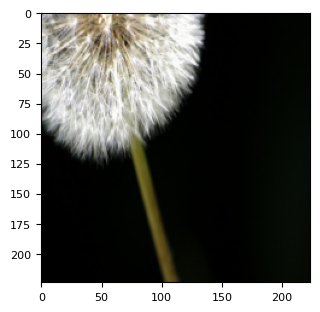

In [11]:
(imgs,labels) = next(iter(train_loader)) # (images,labels)
ps(imgs,'imgs')       # images
ps(labels,'labels')   # labels
print(CLASS_train[labels[0]])       # 0번 label
plt.imshow(imgs[0].permute(1, 2, 0))# 0번 image
plt.show()

In [12]:
p(train_imgs,'train_imgs') #dataset을 folder에서 읽어서 제공

print(len(train_imgs))     #dataset의 수를 알고 있음
img, label = train_imgs[0] #첫번째 data tuple: (image[0],label[0])
# img: (3,224,244)
# label: int

[train_imgs]:
Type: <class 'torchvision.datasets.folder.ImageFolder'>
Values: Dataset ImageFolder
    Number of datapoints: 2567
    Root location: flower_photos_sp/train
    StandardTransform
Transform: Compose(
                 ToImage()
                 Resize(size=[224, 224], interpolation=InterpolationMode.BILINEAR, antialias=True)
                 ToDtype(scale=True)
           )
2567


In [13]:
p(train_loader,'train_loader')            # dataloader object
p(len(train_loader),'len(train_loader)')  # batche단위 iteration 수
ps(next(iter(train_loader))[0],'next(iter())[0]')# images:(320,3,224,224)
ps(next(iter(train_loader))[1],'next(iter())[1]')# labels:(320,)

[train_loader]:
Type: <class 'torch.utils.data.dataloader.DataLoader'>
Values: <torch.utils.data.dataloader.DataLoader object at 0x7a5d0cde6630>
[len(train_loader)]:
Type: <class 'int'>
Values: 9
[next(iter())[0]] Shapetorch.Size([320, 3, 224, 224])
[next(iter())[1]] Shapetorch.Size([320])


In [14]:
print(next(iter(train_imgs))[0].shape)  #첫번째 tuple의 image:(3,244,244)
print(next(iter(train_loader))[0].shape)#첫번째 batch의 images:(320,3,244,244)

torch.Size([3, 224, 224])
torch.Size([320, 3, 224, 224])


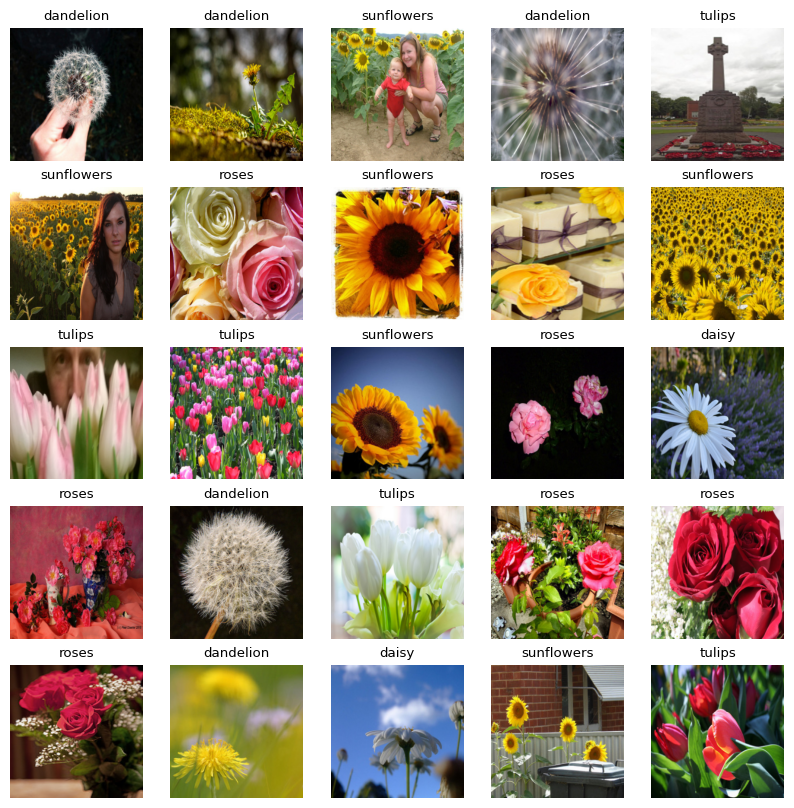

In [15]:
img_batch, l_batch = next(iter(train_loader))
plt.figure(figsize=(10,10))
for n in range(25):
    i = img_batch[n]
    ax = plt.subplot(5,5,n+1)
    plt.imshow(i.permute(1, 2, 0))
    plt.title(CLASS_train[l_batch[n]])
    plt.axis('off')

## torchvision.transforms.v2 API : transform + augmentation
https://pytorch.org/vision/stable/transforms.html#


| basic transform | description|
|---|---|
Normalize(mean, std[, inplace]) | Normalize a tensor image
ToImage() | Convert to tensor.
ToDtype() | Convert to Dtype tensor. & scaling  
PILToTensor() | PIL Image to a tensor  
ToPILImage([mode]) | tensor to PIL Image.



|image transform function | description|
|--- | ---|
CenterCrop(size) | Center crop.
FiveCrop(size) | four corners and the central crop.
TenCrop(size[, vertical_flip]) | four corners, center crop and flip
RandomCrop(size[, padding, pad_if_needed, …]) | Crop at a  random location.
RandomResizedCrop(size[, scale, ratio, …]) | Crop a random portion and resize
RandomVerticalFlip([p]) | Vertically flip
RandomHorizontalFlip([p]) | Horizontally flip
RandomRotation(degrees[, interpolation, …]) | Rotate the image by angle
Resize(size[, interpolation, max_size, …]) | Resize the input image
---
Pad(padding[, fill, padding_mode]) | all sides with the given “pad” value.
ColorJitter([brightness, contrast, …]) | brightness, contrast, saturation, hue transformation
RandomInvert([p]) | Inverts the colors
---
Grayscale([num_output_channels]) | to grayscale.
RandomGrayscale([p]) | Randomly convert image to grayscale
---
RandomAffine(degrees[, translate, scale, …]) | Random affine transformation
RandomApply(transforms[, p]) | Apply randomly a list of transformations
RandomPerspective([distortion_scale, p, …]) | random perspective transformation
----
GaussianBlur(kernel_size[, sigma]) | Blurs image with Gaussian blur.
RandomPosterize(bits[, p]) | reducing the number of bits
RandomSolarize(threshold[, p]) | inverting all pixel values that exceed the threshold.
RandomAdjustSharpness(sharpness_factor[, p]) | Adjust the sharpness of the image
RandomAutocontrast([p]) | Autocontrast the pixels
RandomEqualize([p]) | Equalize the histogram
RandomErasing([p, scale, ratio, value, inplace]) | rectangle region in image  erases


```python
# transform 결합하기
transforms = v2.Compose([
    v2.ToImage(),  # Convert to tensor, only needed if you had a PIL image
    v2.ToDtype(torch.uint8, scale=True),  # optional, most input are already uint8 at this point
    # ...
    v2.RandomResizedCrop(size=(224, 224), antialias=True),  # Or Resize(antialias=True)
    # ...
    v2.ToDtype(torch.float32, scale=True),  # Normalize expects float input
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
```


### Test Data batch 만들기

- 적당한 사진 얻기

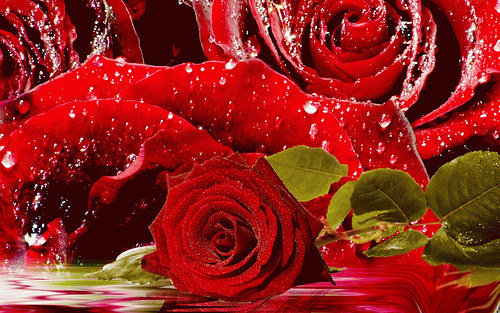

In [26]:
roses = list(sp_train.glob('roses/*'))
img = Image.open(roses[9])
img

* image copy: (h,w,c)->(bs,h,w,c)



In [27]:
# (h,w,c) -> (9,h,w,c)
data = np.array(img)
pst(data,'data')
batch_image = \
  np.ndarray([9,data.shape[0],data.shape[1],3])
for i in range(9): batch_image[i] = img
pst(batch_image,'batch_image')

[data] Shape(313, 500, 3), <class 'numpy.ndarray'>
[batch_image] Shape(9, 313, 500, 3), <class 'numpy.ndarray'>


### CustomDataset( )

In [28]:
from PIL import Image

class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, x, transforms):
        self.x = x
        self.transforms = transforms
    def __len__(self):
        return len(self.x)
    def __getitem__(self, index: int):
        image = Image.fromarray(self.x[index].astype(np.uint8))
        if self.transforms is not None:
            image = self.transforms(image)
        return image

In [29]:
transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    # v2.RandomHorizontalFlip(0.5),
    # v2.RandomVerticalFlip(0.5),
    # v2.RandomRotation(degrees=(0, 180)),
    # v2.RandomResizedCrop(224, scale=(0.5, 1.0)),
    # v2.RandomAffine(degrees=0, shear=45),
    # v2.ColorJitter(hue=0.2),
    # v2.RandomAffine(degrees=(30, 70),
    #                 translate=(0.1, 0.3),
    #                 scale=(0.5, 0.75)),
    # v2.AutoAugment(),
    # v2.RandAugment(),
    # v2.TrivialAugmentWide(),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=transforms)
dataloader = DataLoader(dataset, batch_size=6)

batch = next(iter(dataloader))
pst(batch, 'batch')

[batch] Shapetorch.Size([6, 3, 224, 224]), <class 'torch.Tensor'>


In [30]:
batch.shape

torch.Size([6, 3, 224, 224])

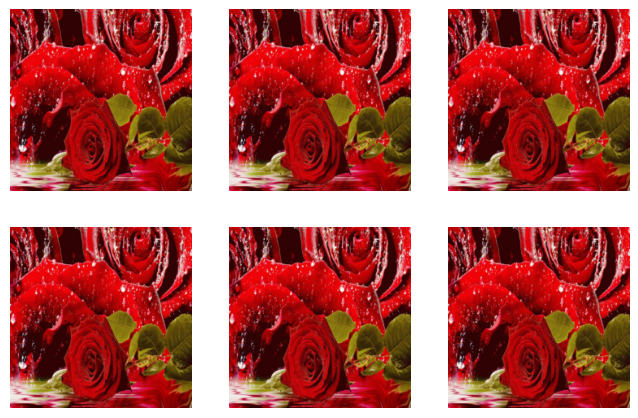

In [31]:
def dataset_plt(dataset):
    dataloader = DataLoader(dataset, batch_size=6)
    batch = next(iter(dataloader))
    batch = batch.permute(0,2,3,1)
    plt.figure(figsize=(8,8))
    for i in range(min(9,batch.shape[0])):
        plt.subplot(330 + 1 + i)
        # plt을 위해 type 변경
        if max(batch[i,0,:,0])>1 :
            image = batch[i].astype('uint8')
        else:
            image = batch[i]
        # plot raw pixel data
        plt.axis('off')
        plt.imshow(image)
    # show the figure
    plt.show()

dataset = CustomDataset(batch_image, transforms=transform)
dataset_plt(dataset)

## Augmentation Transforms

### RandomAffine

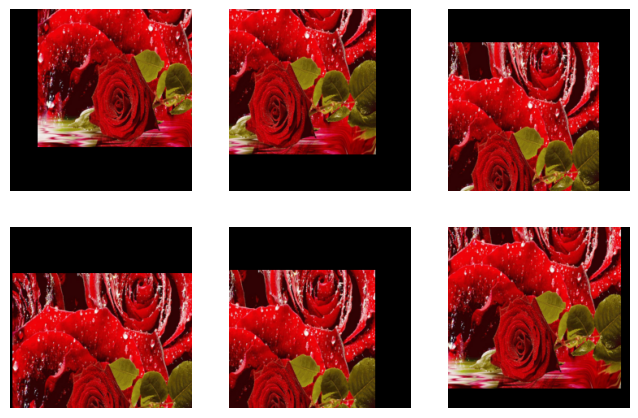

In [32]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    # dgrees, translate, scale, shear
    v2.RandomAffine(degrees=0, translate = (0.2, 0.3)),
    v2.ToDtype(torch.float32, scale=True) ] )
dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

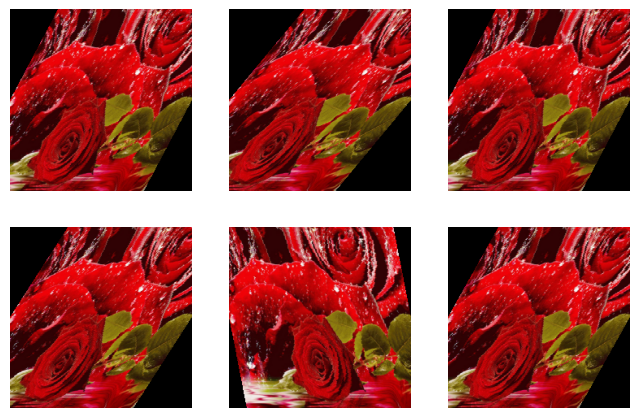

In [33]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    # dgrees, translate, scale, shear
    v2.RandomAffine(degrees=0, shear=45),
    v2.ToDtype(torch.float32, scale=True) ] )
dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

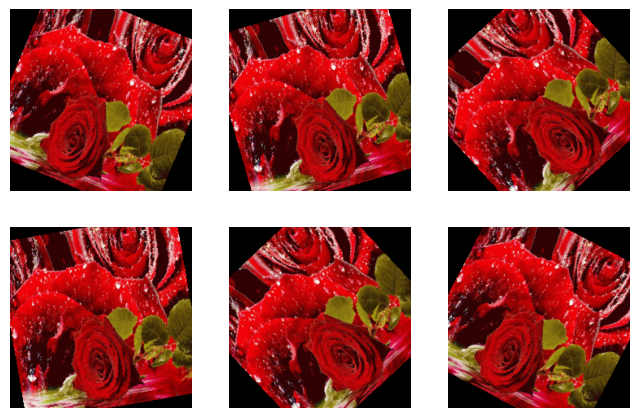

In [34]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    # dgrees, translate, scale, shear
    v2.RandomAffine(degrees=45),
    v2.ToDtype(torch.float32, scale=True) ] )
dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

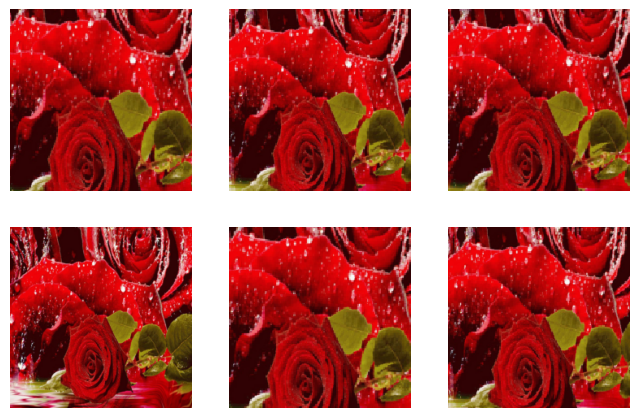

In [35]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    # dgrees, translate, scale, shear
    v2.RandomAffine(degrees=0,scale=(1.0,1.5)),
    v2.ToDtype(torch.float32, scale=True) ] )
dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### RandomHorizontalFlip / RandomVerticalFlip

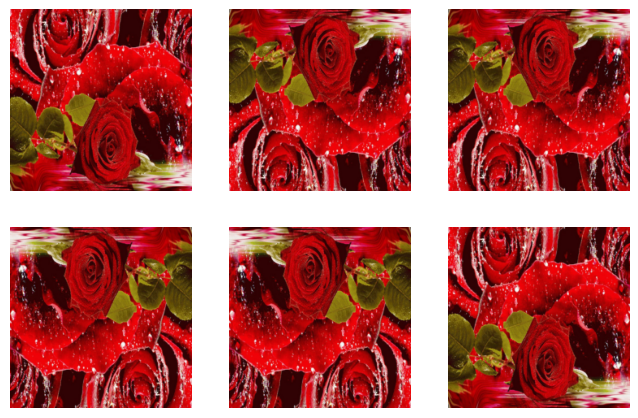

In [36]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.RandomHorizontalFlip(0.5),
    v2.RandomVerticalFlip(0.5),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### RandomRotation

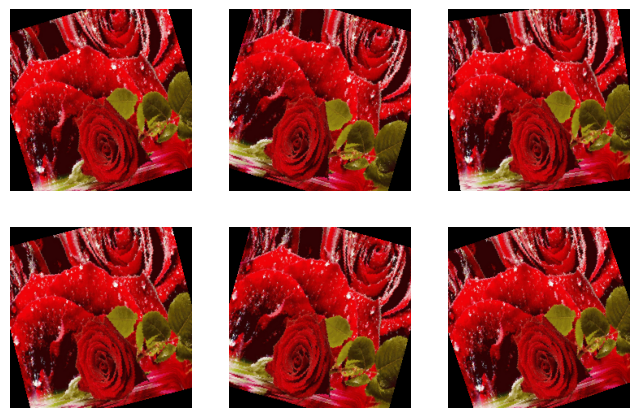

In [37]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.RandomRotation(degrees = 45),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### RandomResizedCrop

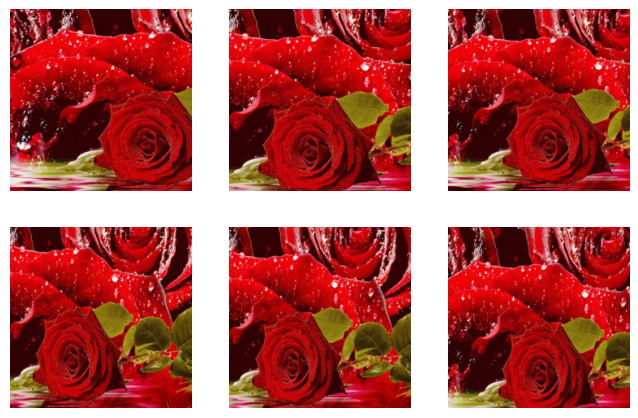

In [38]:
_transforms = v2.Compose([
    v2.ToImage(),
#    v2.Resize((224, 224)),
    v2.RandomResizedCrop((224,224), scale=(0.5, 1.0),ratio=(3./4.,4./3.)),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### ColorJitter

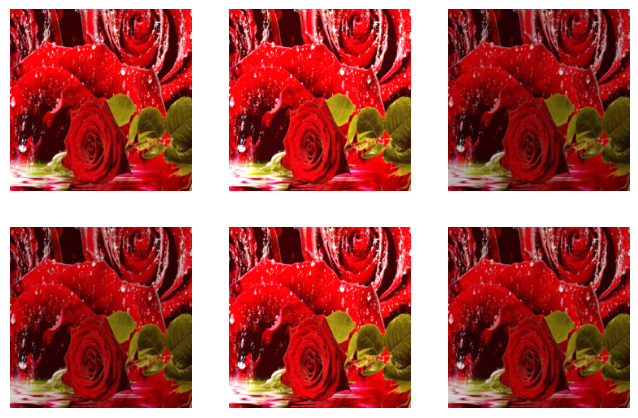

In [39]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.ColorJitter(brightness=(0.5, 1.5)),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

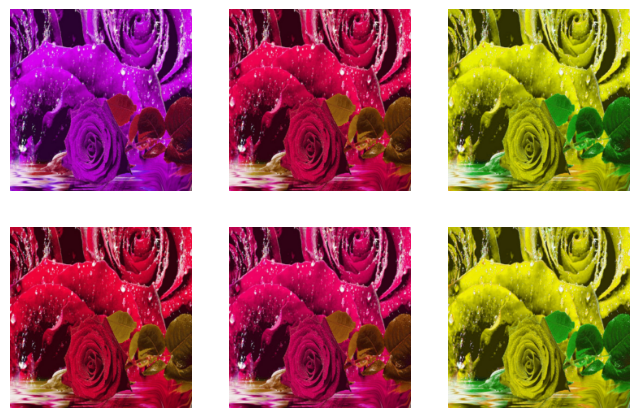

In [40]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.ColorJitter(hue=0.2),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

In [ ]:
### RandomEqualize

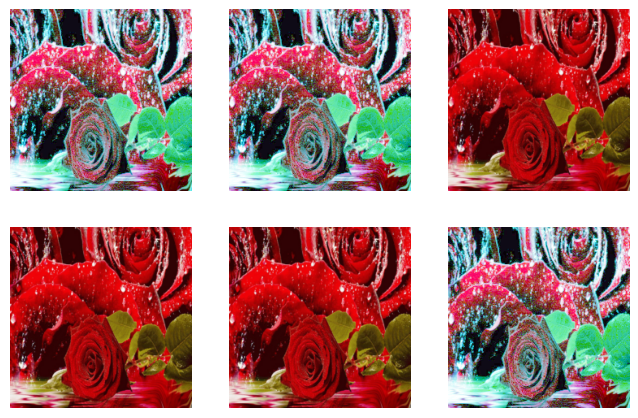

In [41]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.RandomEqualize(p=0.5),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### RandomAutocontrast

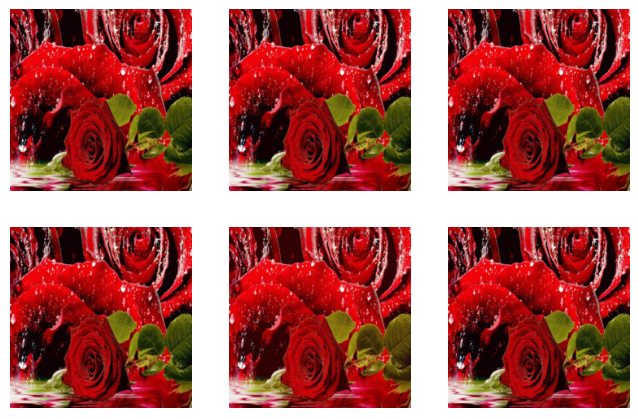

In [42]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.RandomAutocontrast(p=0.5),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### RandomPerspective

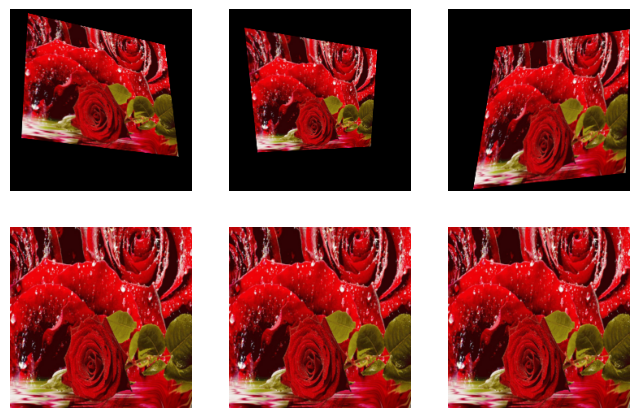

In [44]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.RandomPerspective(distortion_scale=0.6),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### RandomInvert

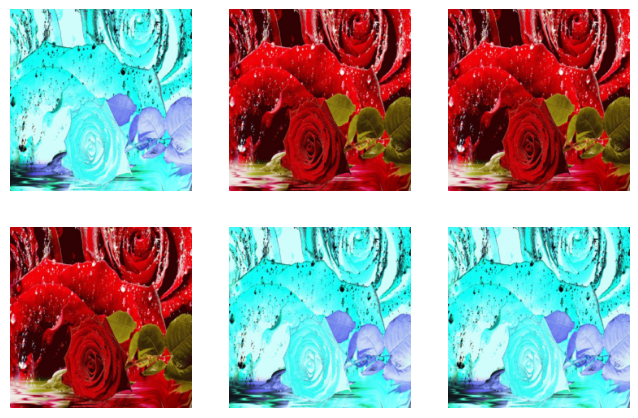

In [45]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.RandomInvert(),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### RandomPosterize

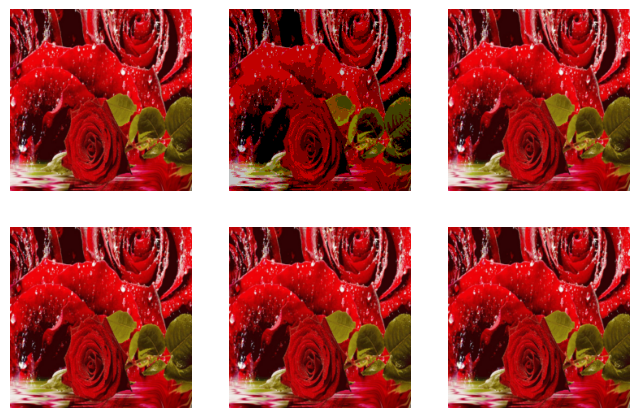

In [47]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    # reducing the number of bits of each color channel.
    v2.RandomPosterize(bits=2,p=0.5),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### RandomSolarize

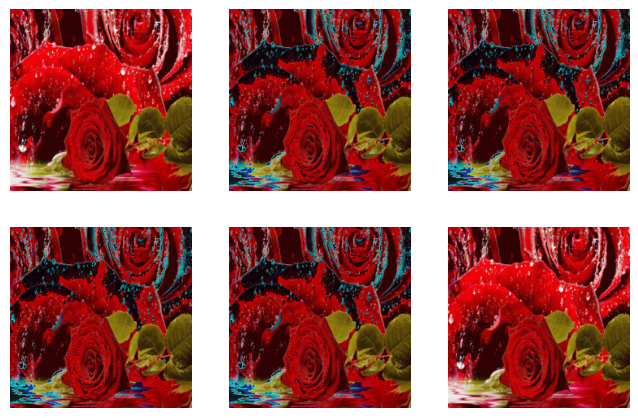

In [48]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    #inverting all pixel values above the threshold.
    v2.RandomSolarize(threshold=200.0),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### AutoAugment

SVHN dataset: http://ufldl.stanford.edu/housenumbers/

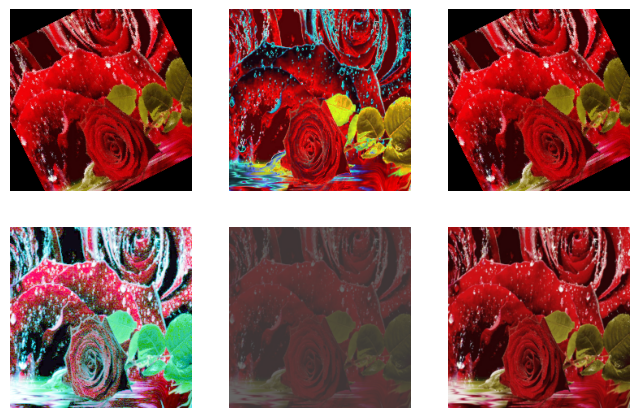

In [49]:
# “AutoAugment: Learning Augmentation Strategies from Data”.2019
policies = [v2.AutoAugmentPolicy.CIFAR10,
            v2.AutoAugmentPolicy.IMAGENET,
            v2.AutoAugmentPolicy.SVHN]

_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.AutoAugment(policies[1]),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### RandAugment

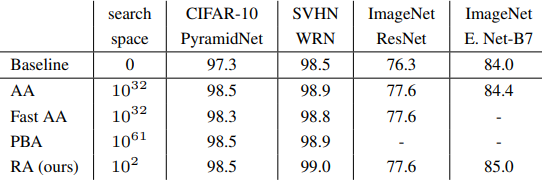

AA : AutoAugment, RA:RandAugment   

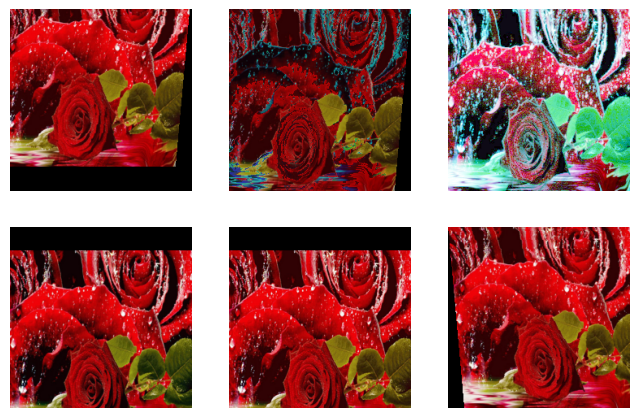

In [53]:
# “RandAugment: Practical automated data augmentation with a reduced search space”.2019
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.RandAugment(),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### TrivialAugmentWide

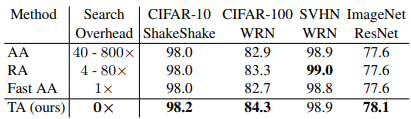

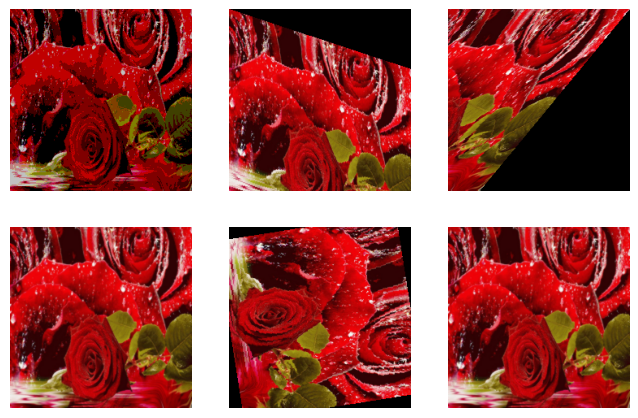

In [56]:
# “TrivialAugment: Tuning-free Yet State-of-the-Art Data Augmentation”.2021
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.TrivialAugmentWide(),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### AugMix  



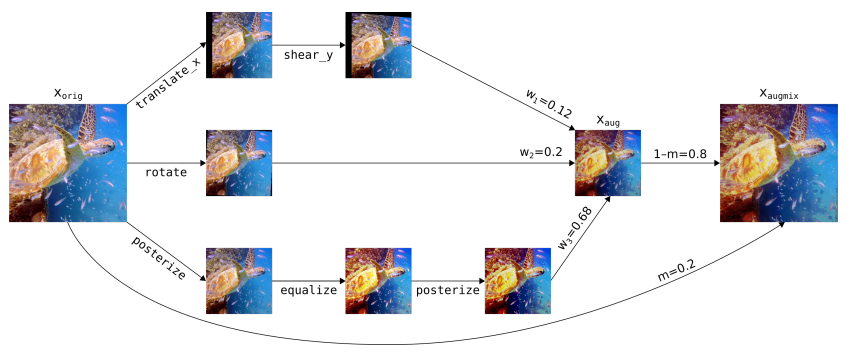

**CIFAR-10-C Dataset**   
* CIFAR-10의 테스트 이미지 10,000장에 15가지 유형의 corruption을 5단계 강도로 적용한 총 75가지 변형 이미지셋을 생성.  
- Noise :	Gaussian noise, Shot noise, Impulse noise
- Blur : 	Defocus blur, Glass blur, Motion blur, Zoom blur
- Weather : 	Snow, Frost, Fog, Brightness
- Digital	: Contrast, Elastic transform, Pixelate, JPEG compression  

일상적인 image의 문제들에 모델이 얼마나 강건한지 비교하기 위해 만들어짐

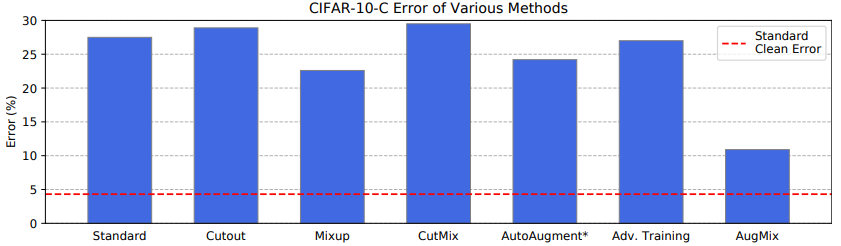

**Error rates of various methods on `CIFAR-10-C` using a ResNeXt backbone.**

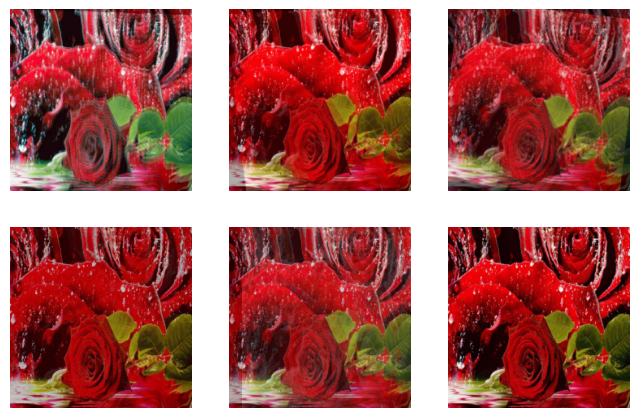

In [57]:
# “AugMix: A Simple Data Processing Method to Improve Robustness and Uncertainty”.2019
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.AugMix(),
    v2.ToDtype(torch.float32, scale=True) ] )

dataset = CustomDataset(batch_image, transforms=_transforms)

dataset_plt(dataset)

### **실습 과제**

-- augmentation option을 다양하게 넣어 동시에 작동하도록 해보자  
--- Folder에 읽은 image들에 적용하고 plot하여 확인 하자


**과제 예시**

In [ ]:
_transforms = v2.Compose([
    v2.ToImage(),
    v2.Resize((224, 224)),
    v2.RandomAffine(degrees=45),
    v2.ColorJitter(brightness=(0.5, 1.5)),
    v2.RandomResizedCrop(224, scale=[0.5, 1.0]),
    v2.RandomHorizontalFlip(0.5),
    v2.ToDtype(torch.float32, scale=True) ] )

## ImageFolder : folder로 구성된 image set을 위한 loader
train_imgs = ImageFolder(sp_train, transform=_transforms) #(image,label)
test_imgs = ImageFolder(sp_test, transform=_transforms)

## DataLoader : dataset과 sampler를 결합 batch단위 제공 #(image,label)*batch
train_loader = DataLoader(train_imgs, batch_size=320, shuffle=True)
test_loader = DataLoader(test_imgs, batch_size=320, shuffle=True)

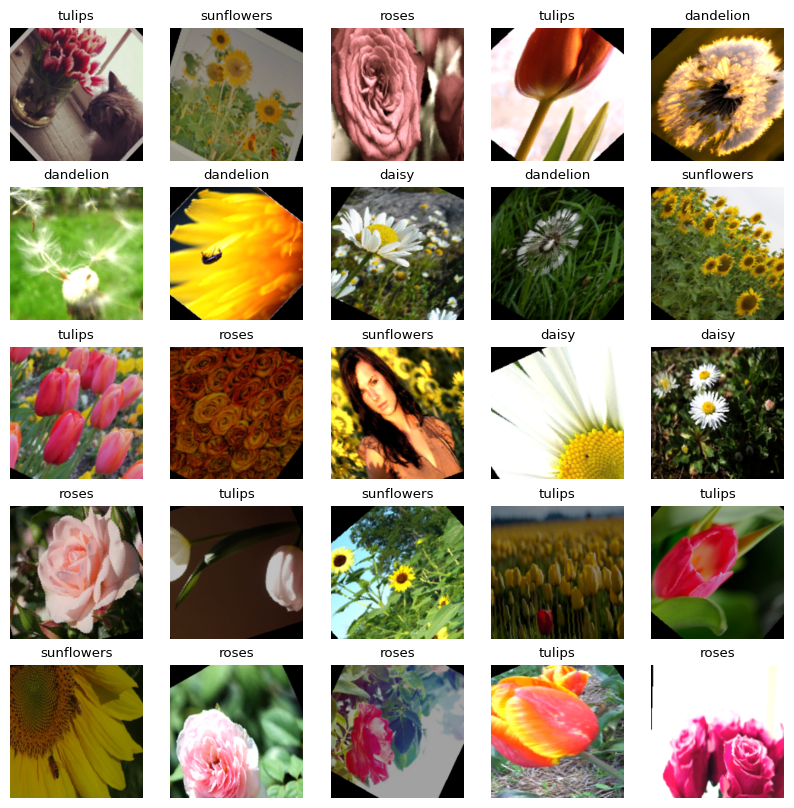

In [ ]:
img_batch, l_batch = next(iter(test_loader))
plt.figure(figsize=(10,10))
for n in range(25):
    i = img_batch[n]
    ax = plt.subplot(5,5,n+1)
    plt.imshow(i.permute(1, 2, 0))
    plt.title(CLASS_train[l_batch[n]])
    plt.axis('off')